<a href="https://colab.research.google.com/github/AbigailMRod/GANsDL.AI/blob/main/UNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#UNet

En este cuaderno, se implementará una U-Net para una tarea de segmentación de imágenes biomédicas. Específicamente, vas a etiquetar neuronas, ¡así que uno podría llamar a esto una red neuronal neuronal! ;)

Tenga en cuenta que esto no es una GAN, un modelo generativo o una tarea de aprendizaje no supervisada. Esta es una tarea de aprendizaje supervisado, por lo que solo hay una respuesta correcta (¡como un clasificador!). Verá cómo este componente es la base del componente Generador de Pix2Pix en el próximo cuaderno.



## Empezando
Comenzará importando bibliotecas, definiendo una función de visualización y obteniendo el conjunto de datos neuronales que usará.

#### Conjunto de datos
Para este cuaderno, utilizará un conjunto de datos de microscopía electrónica
Imágenes y datos de segmentación. ¡La información sobre el conjunto de datos que usará se puede encontrar [aquí](https://www.ini.uzh.ch/~acardona/data.html)!

> Arganda-Carreras et al. "Crowdsourcing the creation of image
segmentation algorithms for connectomics". Front. Neuroanat. 2015. https://www.frontiersin.org/articles/10.3389/fnana.2015.00142/full

> <img src="https://ars.els-cdn.com/content/image/1-s2.0-S0169260722001456-gr1.jpg">

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Función de visualización de imágenes: Dado un tensor de imágenes, número de imágenes y
    tamaño por imagen, traza e imprime las imágenes en una cuadrícula uniforme.
    '''
    # image_shifted = (image_tensor + 1) / 2
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Arquitectura U-Net
Ahora puede construir su U-Net a partir de sus componentes. La siguiente figura es del artículo, [*U-Net: Convolutional Networks for Biomedical Image Segmentation*](https://arxiv.org/abs/1505.04597), de Ronneberger et al. 2015. Muestra la arquitectura U-Net y cómo se contrae y luego se expande.

![Figure 1 from the paper, U-Net: Convolutional Networks for Biomedical Image Segmentation](https://drive.google.com/uc?export=view&id=1XgJRexE2CmsetRYyTLA7L8dsEwx7aQZY)

En otras palabras, las imágenes se alimentan primero a través de muchas capas convolucionales que reducen la altura y el ancho mientras aumentan los canales, a lo que los autores se refieren como el "camino de contracción". Por ejemplo, un conjunto de dos convoluciones de 2 x 2 con un paso de 2, tomará una imagen en escala de grises de 1 x 28 x 28 (canales, altura, ancho) y dará como resultado una representación de 2 x 14 x 14. La "ruta de expansión" hace lo contrario, aumentando gradualmente la imagen con menos y menos canales.

## Ruta de contracción
Primero implementará los bloques de contracción para la ruta de contracción. Esta ruta es la sección del codificador de U-Net, que tiene varios pasos de reducción de resolución como parte de ella. Los autores dan más detalles de las partes restantes en el siguiente párrafo del artículo (Renneberger, 2015):

>La ruta de contracción sigue la arquitectura típica de una red convolucional. Consiste en la aplicación repetida de dos circunvoluciones de 3 x 3 (circunvoluciones sin relleno), cada una seguida de una unidad lineal rectificada (ReLU) y una operación de agrupación de 2 x 2 máx. con paso 2 para reducción de resolución. En cada paso de reducción de resolución, duplicamos el número de canales de funciones.

In [2]:
class ContractingBlock(nn.Module):
    '''
    Clase ContractingBlockContractingBlock 
     Realiza dos convoluciones seguidas de una operación de agrupación máxima.
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
    '''
    def __init__(self, input_channels):
        super(ContractingBlock, self).__init__()
        # Quiere duplicar el número de canales en la primera convolución
        # y mantén el mismo número de canales en el segundo.
        #### START CODE HERE ####
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3)
        self.activation = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        #### END CODE HERE ####

    def forward(self, x):
        '''
        Función para completar un pase hacia adelante de ContractingBlock:
         Dado un tensor de imagen, completa un bloque de contratación y devuelve el tensor transformado.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
        '''
        x = self.conv1(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x
    
    def get_self(self):
        return self

In [3]:
def test_contracting_block(test_samples=100, test_channels=10, test_size=50):
    test_block = ContractingBlock(test_channels)
    test_in = torch.randn(test_samples, test_channels, test_size, test_size)
    test_out_conv1 = test_block.conv1(test_in)
    # Asegúrese de que la primera convolución tenga la forma correcta
    assert tuple(test_out_conv1.shape) == (test_samples, test_channels * 2, test_size - 2, test_size - 2)
    # Asegúrese de que se utiliza la activación correcta
    assert torch.all(test_block.activation(test_out_conv1) >= 0)
    assert torch.max(test_block.activation(test_out_conv1)) >= 1
    test_out_conv2 = test_block.conv2(test_out_conv1)
    # Asegúrese de que la segunda convolución tenga la forma correcta
    assert tuple(test_out_conv2.shape) == (test_samples, test_channels * 2, test_size - 4, test_size - 4)
    test_out = test_block(test_in)
    # Asegúrese de que la agrupación tenga la forma correcta
    assert tuple(test_out.shape) == (test_samples, test_channels * 2, test_size // 2 - 2, test_size // 2 - 2)

test_contracting_block()
test_contracting_block(10, 9, 8)
print("Success!")

Success!


## Ruta de expansión
A continuación, implementará los bloques de expansión para la ruta de expansión. Esta es la sección de decodificación de U-Net que tiene varios pasos de sobremuestreo como parte de ella. Para hacer esto, también deberá escribir una función de recorte. Esto es para que pueda recortar la imagen de la *ruta de contracción* y concatenarla con la imagen actual en la ruta de expansión; esto es para formar una conexión de salto. Nuevamente, los detalles son del artículo (Renneberger, 2015):

>Cada paso en la ruta de expansión consiste en un muestreo ascendente del mapa de funciones seguido de una convolución de 2 x 2 ("convolución ascendente") que reduce a la mitad el número de canales de funciones, una concatenación con el mapa de funciones correspondientemente recortado de la ruta de contracción, y dos circunvoluciones de 3 x 3, cada una seguida de una ReLU. El recorte es necesario debido a la pérdida de píxeles de borde en cada convolución.

<!-- para que el bloque que se expande pueda cambiar el tamaño, la entrada del bloque que se contrae puede tener el mismo tamaño que la entrada de la capa anterior -->

*Dato curioso: los modelos posteriores basados ​​en esta arquitectura a menudo usan relleno en las convoluciones para evitar que el tamaño de la imagen cambie fuera de los pasos de aumento/reducción de muestreo.*

In [4]:
def crop(image, new_shape):
    '''
    Función para recortar un tensor de imagen: dado un tensor de imagen y la nueva forma,
     recortes a los píxeles del centro.
     Parámetros:
         image: imagen tensor de forma (tamaño de lote, canales, altura, ancho)
         new_shape: un objeto torch.Size con la forma que quieres que tenga x
    '''
    # Hay muchas formas de implementar esta función de recorte, pero es lo que permite
    # ¡la conexión de salto funciona según lo previsto con dos imágenes de diferentes tamaños!
    #### START CODE HERE ####
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - new_shape[2] // 2
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - new_shape[3] // 2
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    #### END CODE HERE ####
    return cropped_image

In [5]:
def test_expanding_block_crop(test_samples=100, test_channels=10, test_size=100):
    # Asegúrese de que la función de recorte tenga la forma correcta
    skip_con_x = torch.randn(test_samples, test_channels, test_size + 6, test_size + 6)
    x = torch.randn(test_samples, test_channels, test_size, test_size)
    cropped = crop(skip_con_x, x.shape)
    assert tuple(cropped.shape) == (test_samples, test_channels, test_size, test_size)

    # Asegúrese de que la función de recorte tome el área correcta
    test_meshgrid = torch.meshgrid([torch.arange(0, test_size), torch.arange(0, test_size)])
    test_meshgrid = test_meshgrid[0] + test_meshgrid[1]
    test_meshgrid = test_meshgrid[None, None, :, :].float()
    cropped = crop(test_meshgrid, torch.Size([1, 1, test_size // 2, test_size // 2]))
    assert cropped.max() == (test_size - 1) * 2 - test_size // 2
    assert cropped.min() == test_size // 2
    assert cropped.mean() == test_size - 1

    test_meshgrid = torch.meshgrid([torch.arange(0, test_size), torch.arange(0, test_size)])
    test_meshgrid = test_meshgrid[0] + test_meshgrid[1]
    crop_size = 5
    test_meshgrid = test_meshgrid[None, None, :, :].float()
    cropped = crop(test_meshgrid, torch.Size([1, 1, crop_size, crop_size]))
    assert cropped.max() <= (test_size + crop_size - 1) and cropped.max() >= test_size - 1
    assert cropped.min() >= (test_size - crop_size - 1) and cropped.min() <= test_size - 1
    assert abs(cropped.mean() - test_size) <= 2

test_expanding_block_crop()
print("Success!")

Success!


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [6]:
class ExpandingBlock(nn.Module):
    '''
    Clase ExpandingBlock
     Realiza un sobremuestreo, una convolución, una concatenación de sus dos entradas,
     seguido de dos circunvoluciones más.
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
    '''
    def __init__(self, input_channels):
        super(ExpandingBlock, self).__init__()
        # "Cada paso en la ruta de expansión consiste en un muestreo superior del mapa de características"
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        # "seguido de una convolución 2x2 que reduce a la mitad el número de canales de funciones"
         # "una concatenación con el mapa de características correspondientemente recortado de la ruta de contratación"
         # "y dos circunvoluciones de 3x3"
        #### START CODE HERE ####
        self.conv1 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=2, stride=1)
        self.conv2 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=3, stride=1)
        self.conv3 = nn.Conv2d(input_channels // 2, input_channels // 2, kernel_size=3, stride=1)
        #### END CODE HERE ####
        self.activation = nn.ReLU() # "cada uno seguido de un ReLU"
 
    def forward(self, x, skip_con_x):
        '''
        Función para completar un pase hacia adelante de ExpandingBlock:
         Dado un tensor de imagen, completa un bloque de expansión y devuelve el tensor transformado.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
             skip_con_x: el tensor de imagen del camino de contracción (del bloque opuesto de x)
                     para la conexión de salto
        '''
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        x = self.activation(x)
        x = self.conv3(x)
        x = self.activation(x)
        return x
    
    def get_self(self):
        return self

In [7]:
def test_expanding_block(test_samples=100, test_channels=10, test_size=50):
    test_block = ExpandingBlock(test_channels)
    skip_con_x = torch.randn(test_samples, test_channels // 2, test_size * 2 + 6, test_size * 2 + 6)
    x = torch.randn(test_samples, test_channels, test_size, test_size)
    x = test_block.upsample(x)
    x = test_block.conv1(x)
    # Asegúrese de que la primera convolución produzca la forma correcta
    assert tuple(x.shape) == (test_samples, test_channels // 2,  test_size * 2 - 1, test_size * 2 - 1)
    orginal_x = crop(skip_con_x, x.shape)
    x = torch.cat([x, orginal_x], axis=1)
    x = test_block.conv2(x)
    # Asegúrese de que la segunda convolución produzca la forma correcta
    assert tuple(x.shape) == (test_samples, test_channels // 2,  test_size * 2 - 3, test_size * 2 - 3)
    x = test_block.conv3(x)
    # Asegúrese de que la convolución final produzca la forma correcta
    assert tuple(x.shape) == (test_samples, test_channels // 2,  test_size * 2 - 5, test_size * 2 - 5)
    x = test_block.activation(x)

test_expanding_block()
print("Success!")

Success!


## Capa final
Ahora escribirá el bloque de mapeo de características final, que toma un tensor con muchos tensores arbitrariamente y produce un tensor con la misma cantidad de píxeles pero con la cantidad correcta de canales de salida. Del artículo (Renneberger, 2015):

>En la capa final, se usa una convolución de 1x1 para asignar cada vector de características de 64 componentes al número deseado de clases. En total la red tiene 23 capas convolucionales.

In [8]:
class FeatureMapBlock(nn.Module):
    '''
    Clase FeatureMapBlock
     La capa final de una UNet -
     asigna cada píxel a un píxel con el número correcto de dimensiones de salida
     usando una convolución 1x1.
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        # "Cada paso en la ruta de expansión consiste en un muestreo superior del mapa de características"
        #### START CODE HERE ####
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)
        #### END CODE HERE ####

    def forward(self, x):
        '''
        Función para completar un pase hacia adelante de FeatureMapBlock:
         Dado un tensor de imagen, lo devuelve mapeado al número de canales deseado.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
        '''
        x = self.conv(x)
        return x

In [9]:
assert tuple(FeatureMapBlock(10, 60)(torch.randn(1, 10, 10, 10)).shape) == (1, 60, 10, 10)
print("Success!")

Success!


## U-Net

¡Ahora puedes ponerlo todo junto! Aquí, escribirá una clase `UNet` que combinará una serie de los tres tipos de bloques que ha implementado.

In [10]:
class UNet(nn.Module):
    '''
    Clase UNet
     Una serie de 4 bloques de contracción seguidos de 4 bloques de expansión para
     transformar una imagen de entrada en la imagen emparejada correspondiente, con una característica mejorada
     capa al principio y una capa de características negativas al final
     Valores:
         input_channels: el número de canales que se esperan de una entrada dada
         output_channels: el número de canales a esperar para una salida dada
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super(UNet, self).__init__()
        # "Cada paso en la ruta de expansión consiste en un muestreo superior del mapa de características"
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.expand1 = ExpandingBlock(hidden_channels * 16)
        self.expand2 = ExpandingBlock(hidden_channels * 8)
        self.expand3 = ExpandingBlock(hidden_channels * 4)
        self.expand4 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)

    def forward(self, x):
        '''
        Función para completar un pase hacia adelante de UNet:
         Dado un tensor de imagen, lo pasa a través de U-Net y devuelve la salida.
         Parámetros:
             x: tensor de imagen de forma (tamaño de lote, canales, altura, ancho)
        '''
        # Tenga en cuenta que la función de expansión toma dos entradas,
        # ambos con el mismo número de canales.
        #### START CODE HERE ####
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.expand1(x4, x3)
        x6 = self.expand2(x5, x2)
        x7 = self.expand3(x6, x1)
        x8 = self.expand4(x7, x0)
        xn = self.downfeature(x8)
        #### END CODE HERE ####
        return xn

In [11]:
#UNIT TEST
test_unet = UNet(1, 3)
assert tuple(test_unet(torch.randn(1, 1, 256, 256)).shape) == (1, 3, 117, 117)
print("Success!")

Success!


## Entrenamiento

¡Finalmente, pondrás esto en acción!
Recuerda que estos son tus parámetros:
   * criterion: la función de pérdida
   * n_epochs: la cantidad de veces que itera a través de todo el conjunto de datos durante el entrenamiento
   * input_dim: el número de canales de la imagen de entrada
   * label_dim: el número de canales de la imagen de salida
   * display_step: con qué frecuencia mostrar/visualizar las imágenes
   * batch_size: el número de imágenes por paso adelante/atrás
   * lr: la tasa de aprendizaje
   * initial_shape: el tamaño de la imagen de entrada (en píxeles)
   * target_shape: el tamaño de la imagen de salida (en píxeles)
   * device: el tipo de dispositivo

¡Esto debería tomar solo unos minutos para entrenar!

In [12]:
import torch.nn.functional as F
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
input_dim = 1
label_dim = 1
display_step = 20
batch_size = 4
lr = 0.0002
initial_shape = 512
target_shape = 373
device = 'cuda'

In [13]:
!git clone https://github.com/AbigailMRod/GANsDL.AI.git

Cloning into 'GANsDL.AI'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 74 (delta 1), reused 6 (delta 1), pack-reused 65
Unpacking objects: 100% (74/74), done.
Checking out files: 100% (25/25), done.


In [14]:
from skimage import io
import numpy as np
volumes = torch.Tensor(io.imread('/content/GANsDL.AI/train_unet/train-volume.tif'))[:, None, :, :] / 255
labels = torch.Tensor(io.imread('/content/GANsDL.AI/train_unet/train-labels.tif', plugin="tifffile"))[:, None, :, :] / 255
labels = crop(labels, torch.Size([len(labels), 1, target_shape, target_shape]))
dataset = torch.utils.data.TensorDataset(volumes, labels)

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 0: Step 0: U-Net loss: 0.6765640377998352


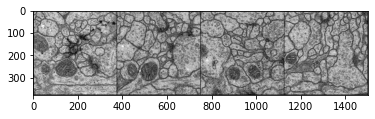

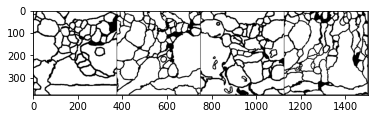

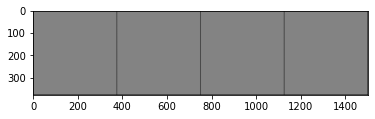

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 2: Step 20: U-Net loss: 0.5319291353225708


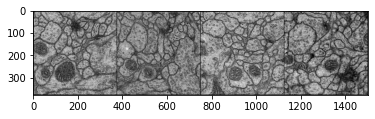

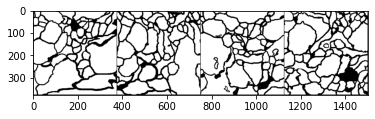

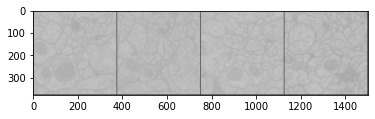

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5: Step 40: U-Net loss: 0.473140150308609


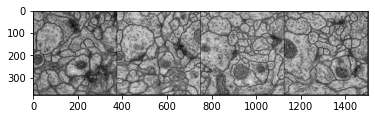

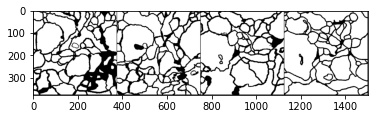

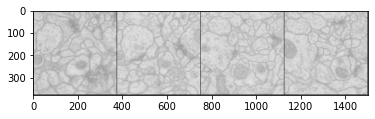

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 7: Step 60: U-Net loss: 0.4032650291919708


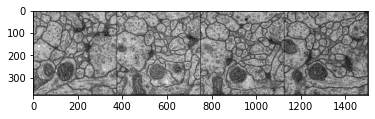

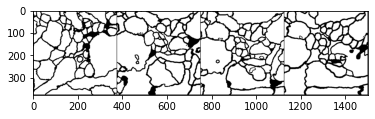

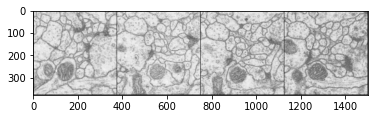

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10: Step 80: U-Net loss: 0.3465670347213745


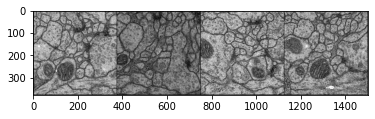

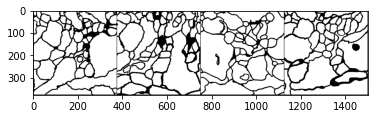

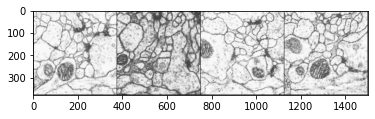

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 12: Step 100: U-Net loss: 0.34910649061203003


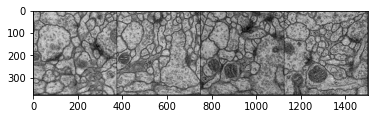

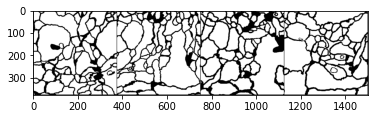

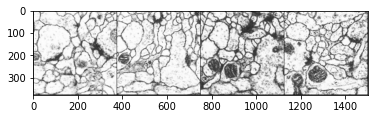

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 15: Step 120: U-Net loss: 0.3828389644622803


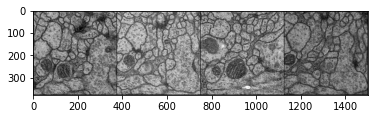

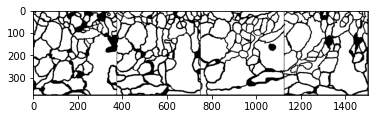

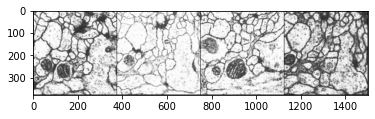

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 17: Step 140: U-Net loss: 0.34139031171798706


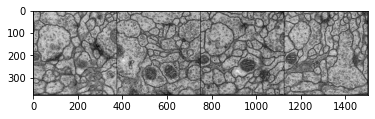

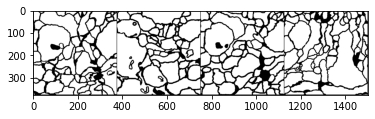

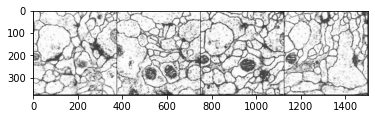

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 20: Step 160: U-Net loss: 0.3599759638309479


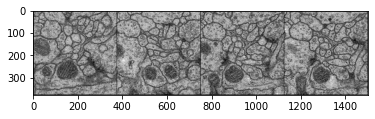

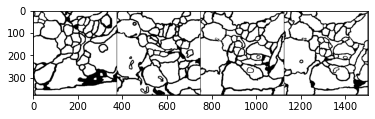

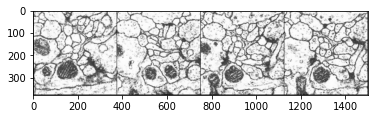

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 22: Step 180: U-Net loss: 0.33447226881980896


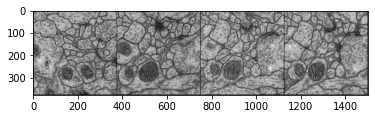

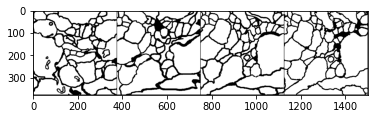

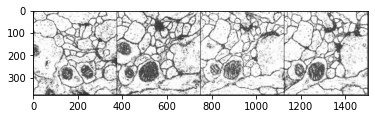

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 25: Step 200: U-Net loss: 0.37651607394218445


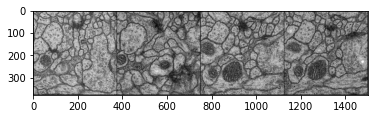

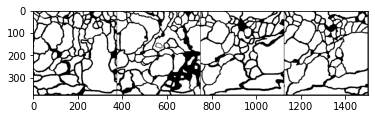

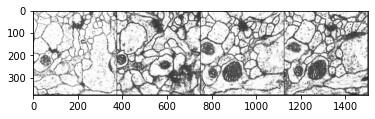

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 27: Step 220: U-Net loss: 0.3634234368801117


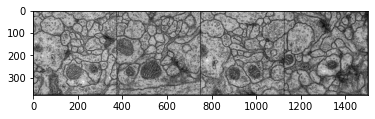

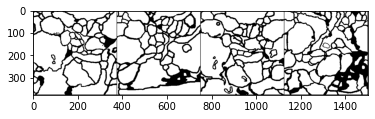

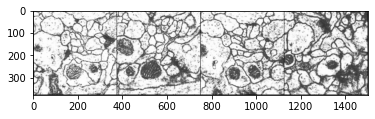

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 30: Step 240: U-Net loss: 0.36776864528656006


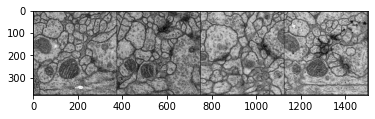

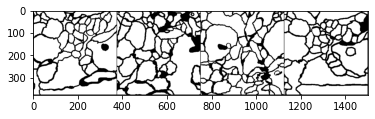

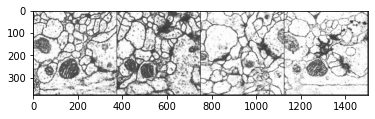

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 32: Step 260: U-Net loss: 0.34164130687713623


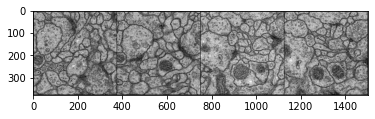

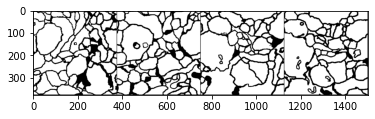

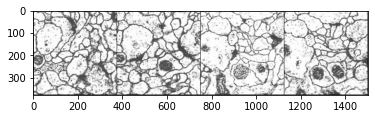

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 35: Step 280: U-Net loss: 0.34969931840896606


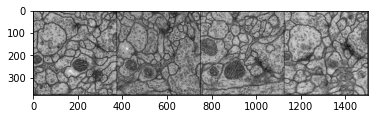

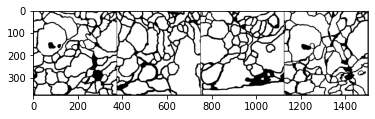

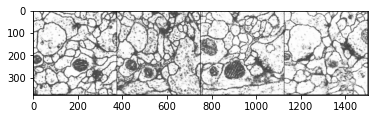

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 37: Step 300: U-Net loss: 0.3298412561416626


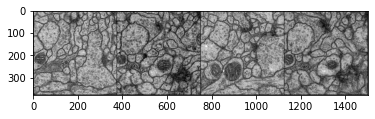

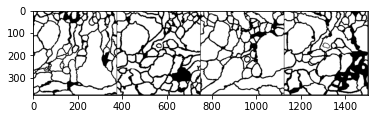

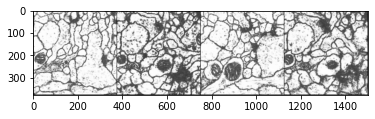

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 40: Step 320: U-Net loss: 0.3573952317237854


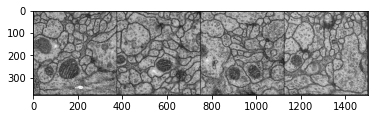

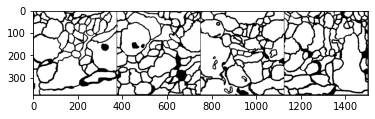

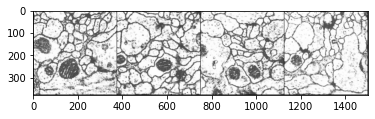

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 42: Step 340: U-Net loss: 0.34198784828186035


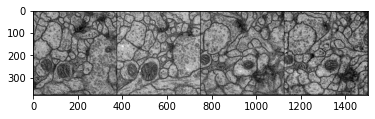

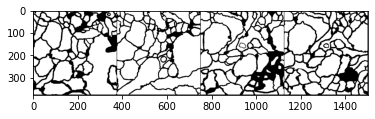

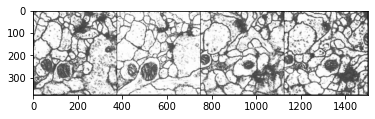

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 45: Step 360: U-Net loss: 0.3730184733867645


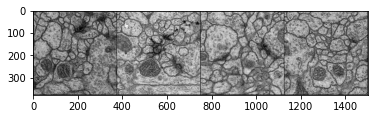

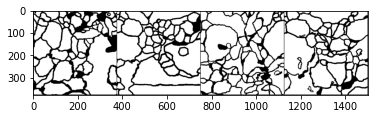

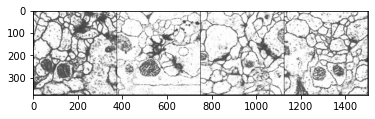

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 47: Step 380: U-Net loss: 0.32437995076179504


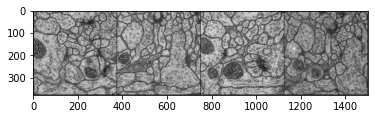

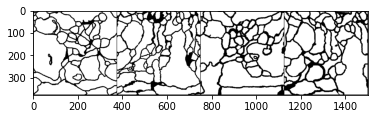

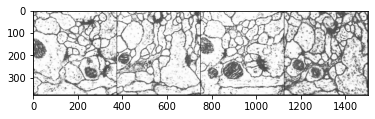

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 50: Step 400: U-Net loss: 0.35077744722366333


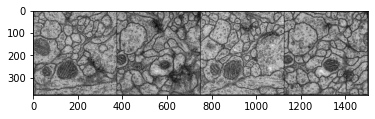

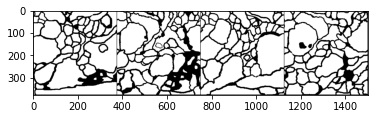

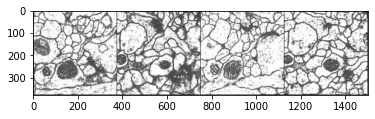

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 52: Step 420: U-Net loss: 0.3203597366809845


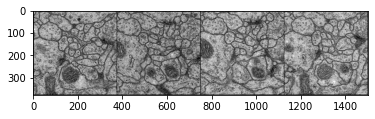

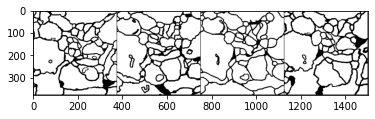

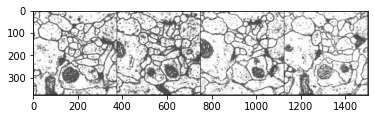

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 55: Step 440: U-Net loss: 0.35650771856307983


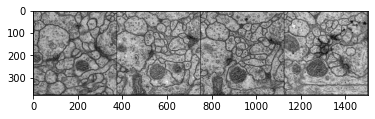

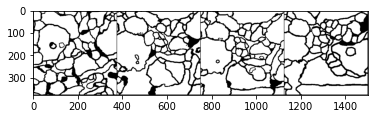

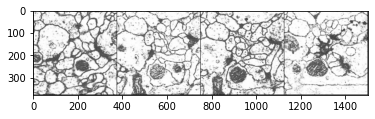

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 57: Step 460: U-Net loss: 0.35322898626327515


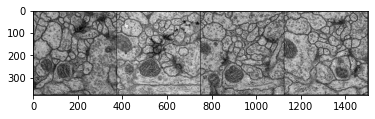

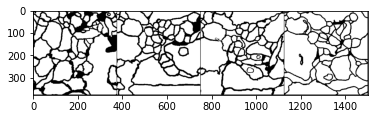

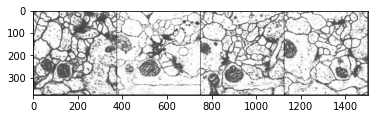

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 60: Step 480: U-Net loss: 0.3236023783683777


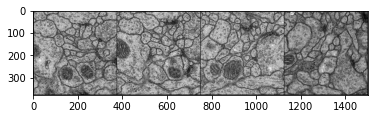

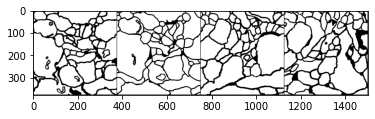

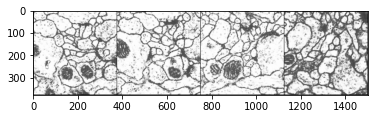

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 62: Step 500: U-Net loss: 0.34434494376182556


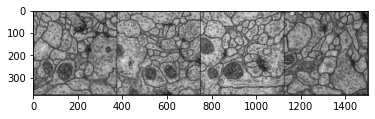

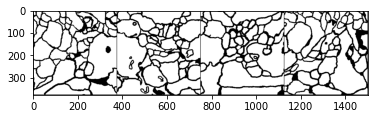

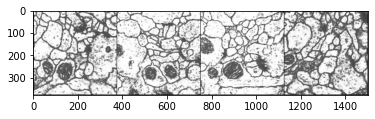

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 65: Step 520: U-Net loss: 0.3259497582912445


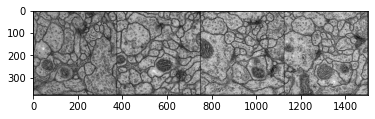

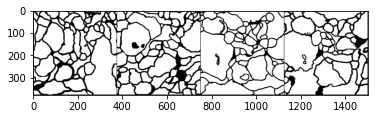

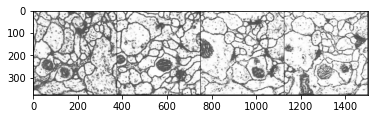

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 67: Step 540: U-Net loss: 0.34307581186294556


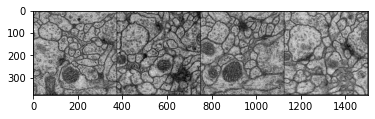

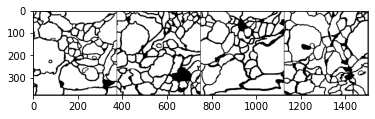

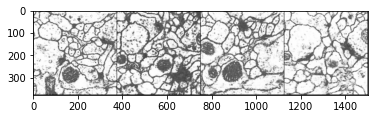

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 70: Step 560: U-Net loss: 0.312441349029541


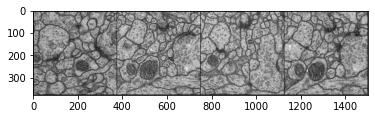

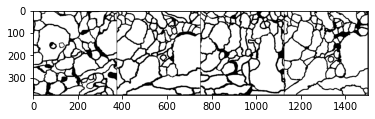

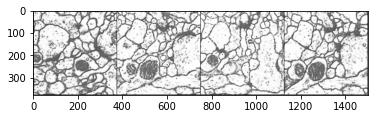

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 72: Step 580: U-Net loss: 0.3153066039085388


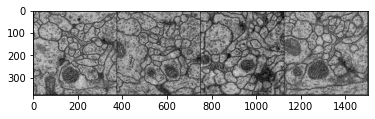

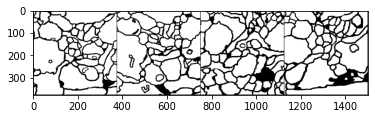

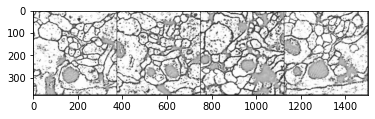

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 75: Step 600: U-Net loss: 0.30309295654296875


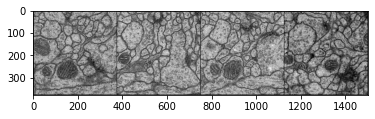

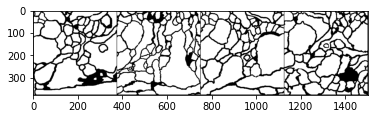

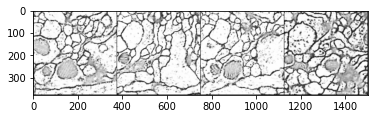

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 77: Step 620: U-Net loss: 0.3107936382293701


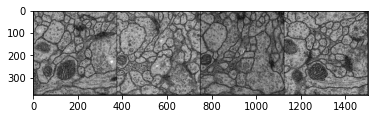

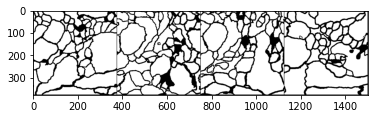

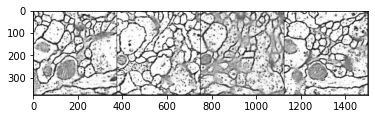

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 80: Step 640: U-Net loss: 0.27655619382858276


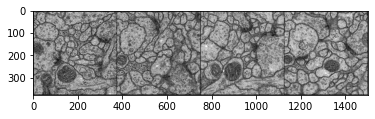

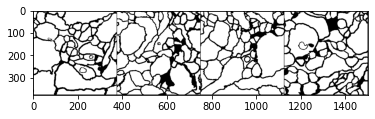

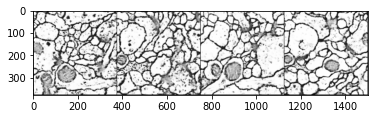

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 82: Step 660: U-Net loss: 0.2936405837535858


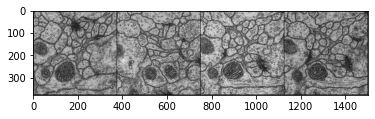

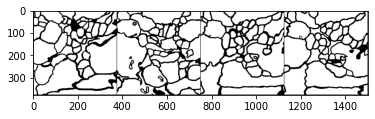

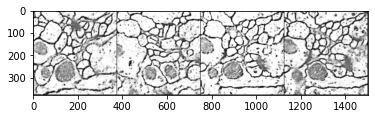

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 85: Step 680: U-Net loss: 0.28225216269493103


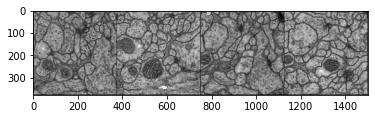

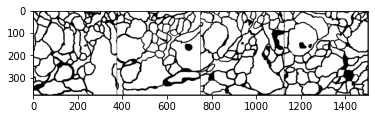

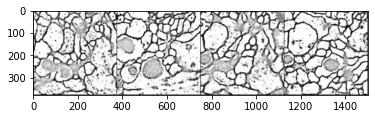

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 87: Step 700: U-Net loss: 0.280992329120636


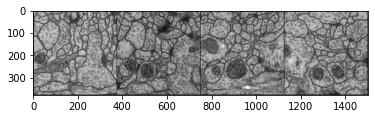

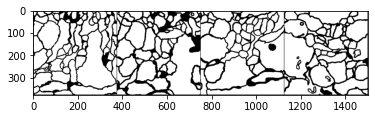

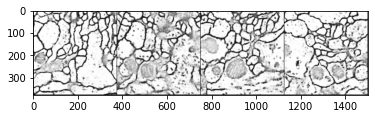

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 90: Step 720: U-Net loss: 0.28596195578575134


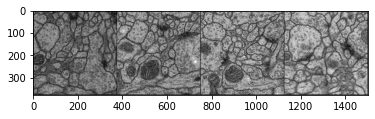

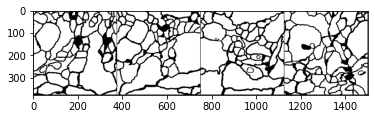

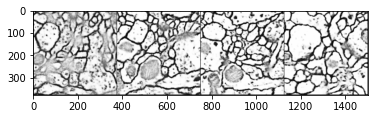

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 92: Step 740: U-Net loss: 0.2926778197288513


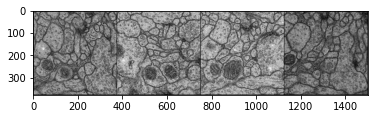

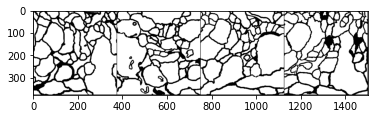

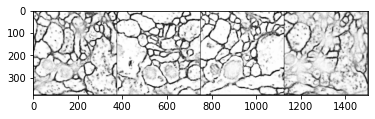

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 95: Step 760: U-Net loss: 0.27644240856170654


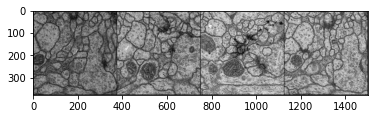

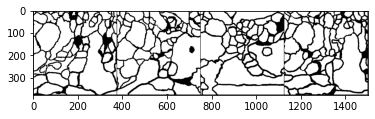

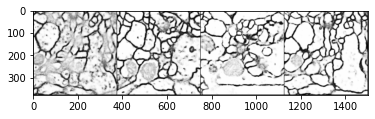

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 97: Step 780: U-Net loss: 0.25774842500686646


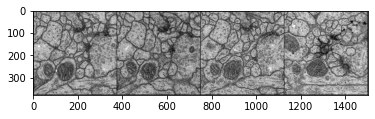

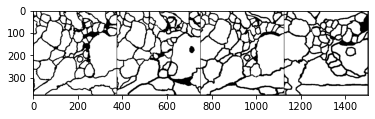

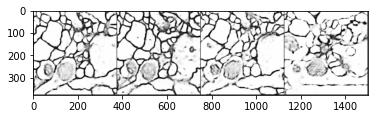

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 100: Step 800: U-Net loss: 0.20838630199432373


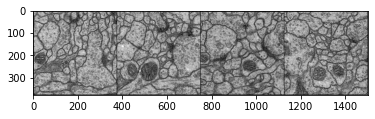

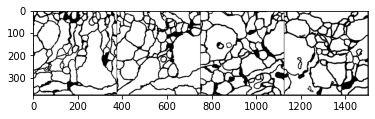

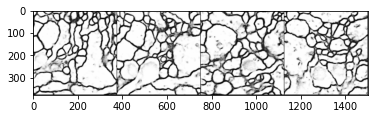

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 102: Step 820: U-Net loss: 0.20382626354694366


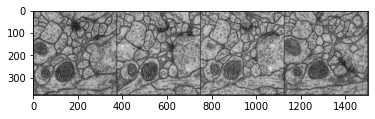

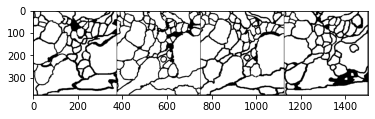

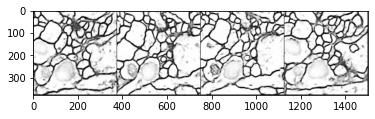

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 105: Step 840: U-Net loss: 0.24944975972175598


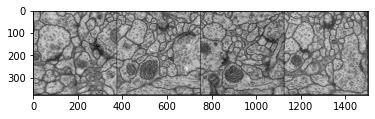

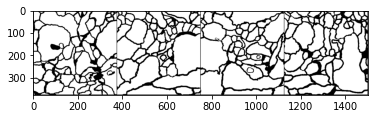

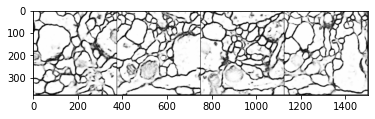

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 107: Step 860: U-Net loss: 0.21912793815135956


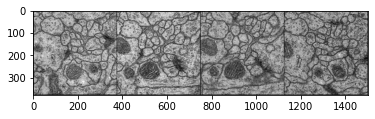

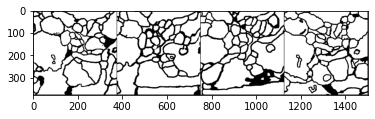

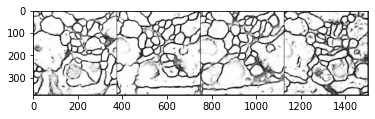

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 110: Step 880: U-Net loss: 0.22551165521144867


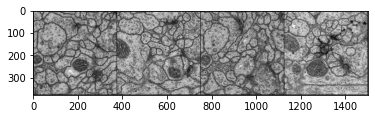

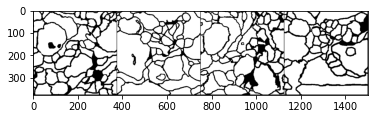

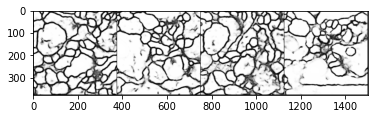

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 112: Step 900: U-Net loss: 0.2053804099559784


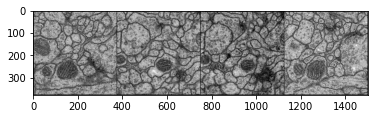

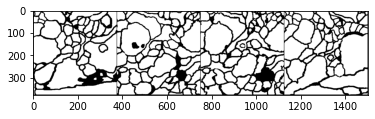

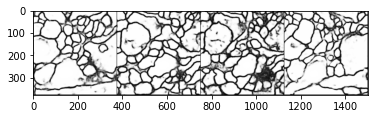

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 115: Step 920: U-Net loss: 0.18597330152988434


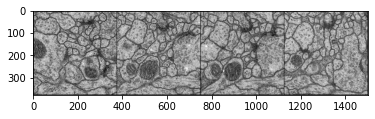

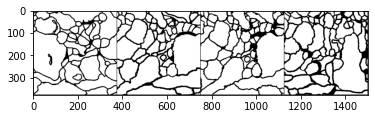

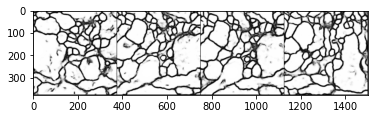

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 117: Step 940: U-Net loss: 0.1898224651813507


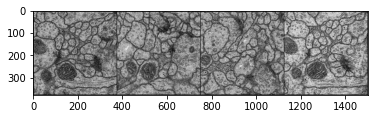

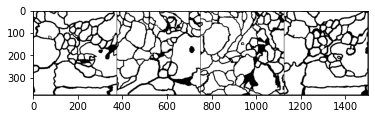

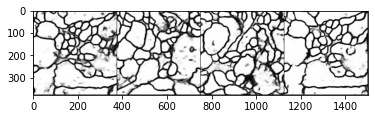

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 120: Step 960: U-Net loss: 0.22075621783733368


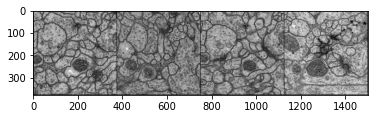

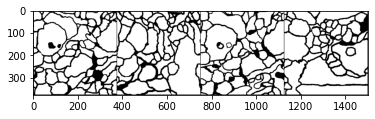

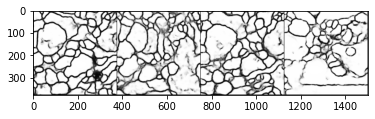

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 122: Step 980: U-Net loss: 0.18959815800189972


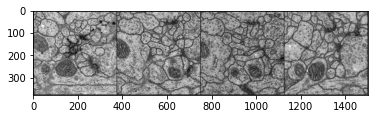

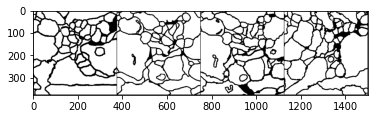

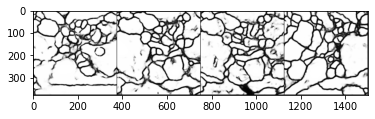

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 125: Step 1000: U-Net loss: 0.1945057064294815


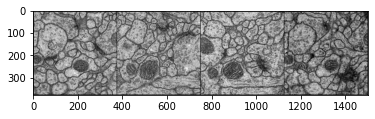

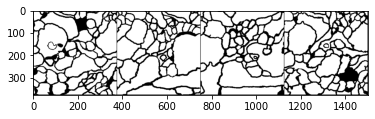

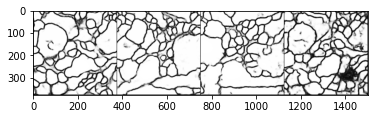

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 127: Step 1020: U-Net loss: 0.20646168291568756


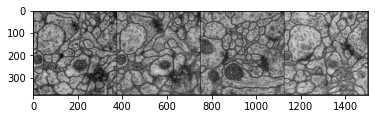

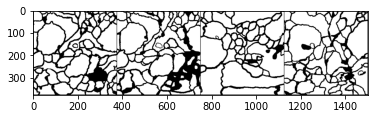

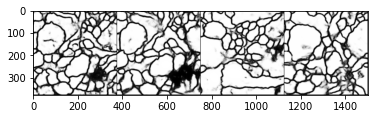

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 130: Step 1040: U-Net loss: 0.16632051765918732


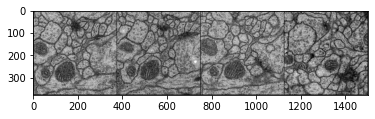

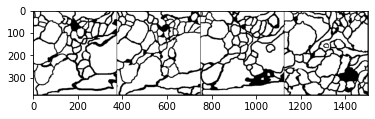

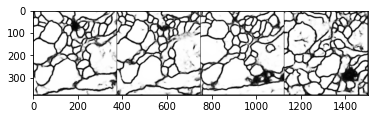

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 132: Step 1060: U-Net loss: 0.15278182923793793


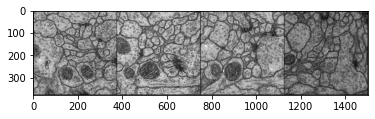

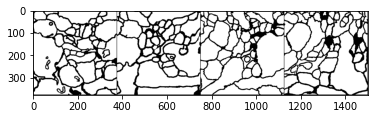

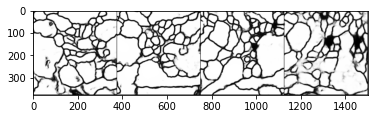

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 135: Step 1080: U-Net loss: 0.15576332807540894


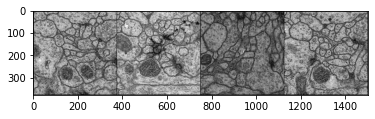

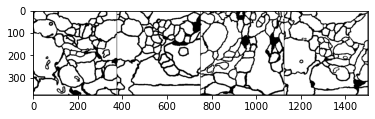

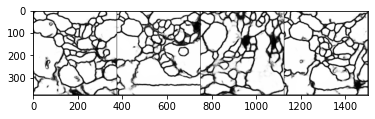

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 137: Step 1100: U-Net loss: 0.16957040131092072


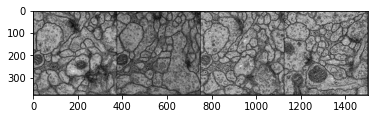

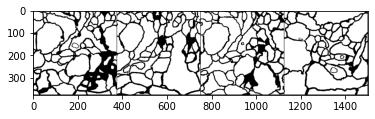

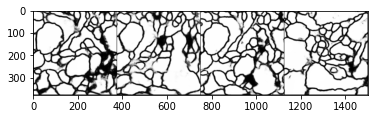

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 140: Step 1120: U-Net loss: 0.1404525488615036


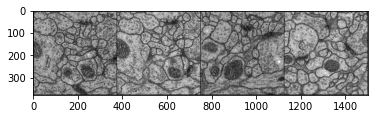

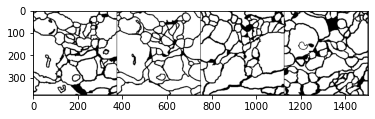

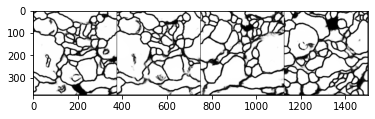

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 142: Step 1140: U-Net loss: 0.1472713202238083


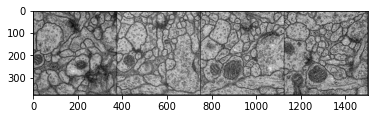

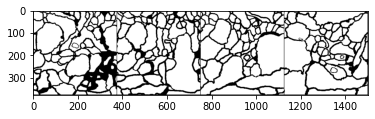

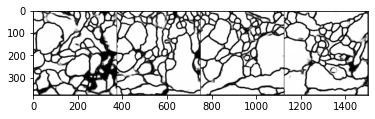

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 145: Step 1160: U-Net loss: 0.1532318890094757


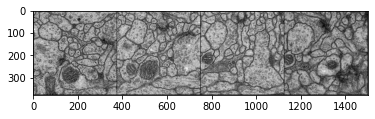

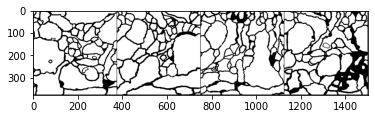

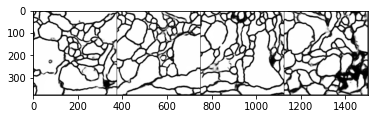

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 147: Step 1180: U-Net loss: 0.13555380702018738


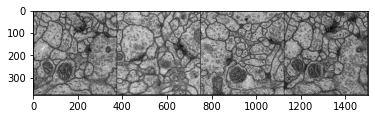

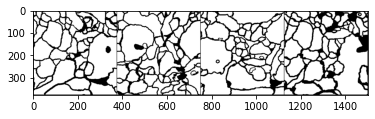

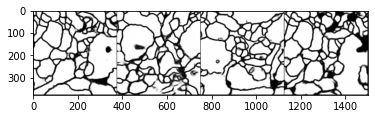

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 150: Step 1200: U-Net loss: 0.12352965027093887


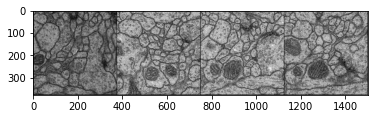

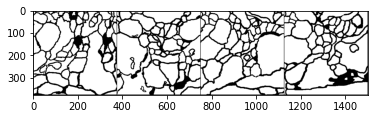

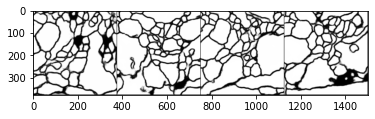

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 152: Step 1220: U-Net loss: 0.1362551599740982


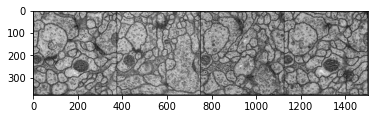

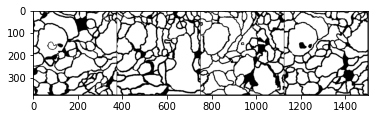

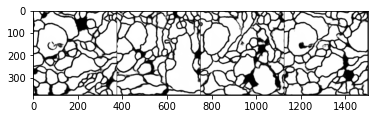

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 155: Step 1240: U-Net loss: 0.12867602705955505


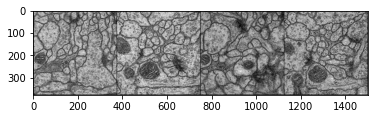

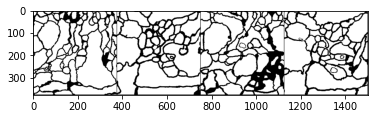

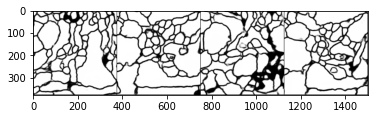

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 157: Step 1260: U-Net loss: 0.12314437329769135


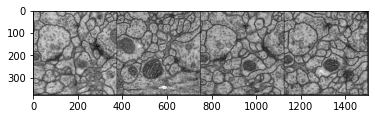

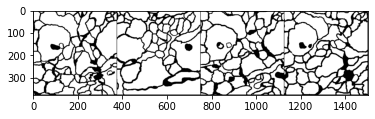

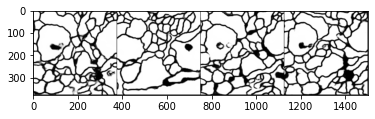

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 160: Step 1280: U-Net loss: 0.11634213477373123


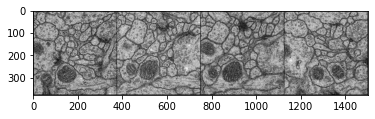

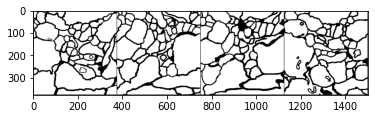

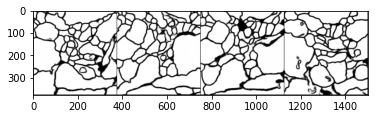

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 162: Step 1300: U-Net loss: 0.1157911866903305


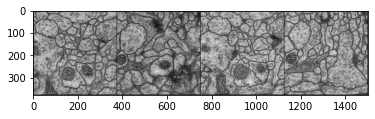

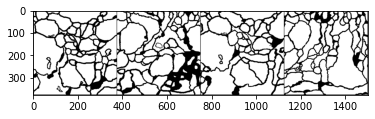

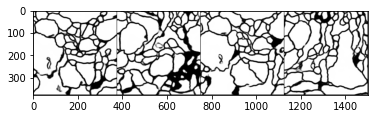

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 165: Step 1320: U-Net loss: 0.108271524310112


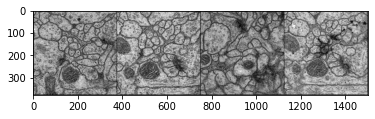

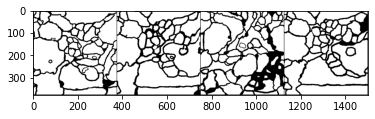

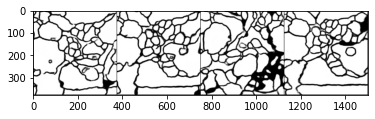

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 167: Step 1340: U-Net loss: 0.10260556638240814


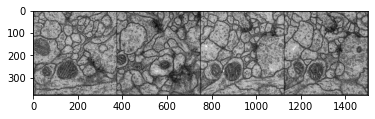

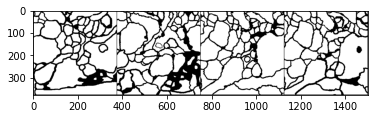

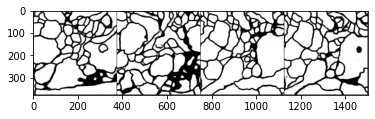

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 170: Step 1360: U-Net loss: 0.09985849261283875


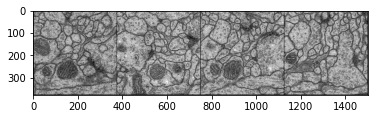

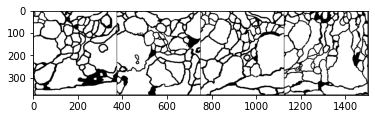

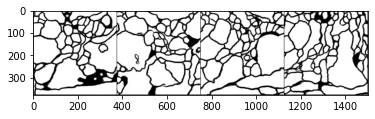

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 172: Step 1380: U-Net loss: 0.09883687645196915


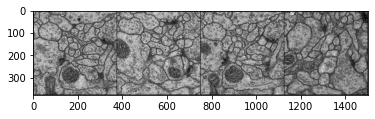

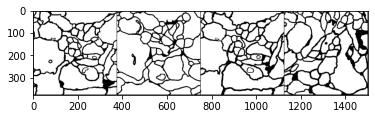

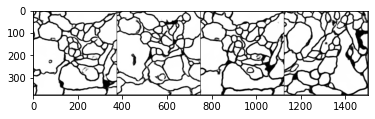

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 175: Step 1400: U-Net loss: 0.09250583499670029


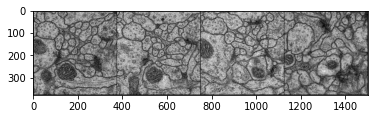

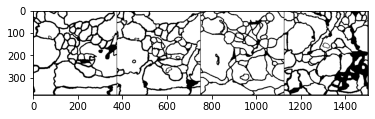

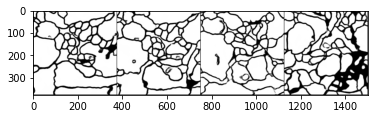

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 177: Step 1420: U-Net loss: 0.08783351629972458


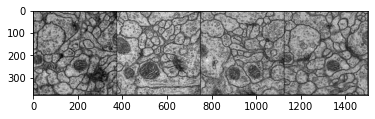

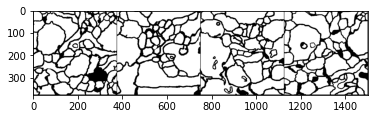

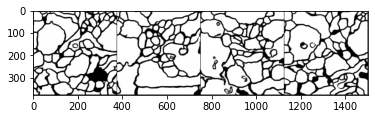

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 180: Step 1440: U-Net loss: 0.07790478318929672


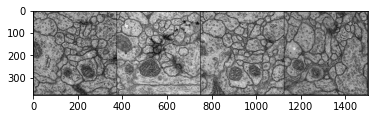

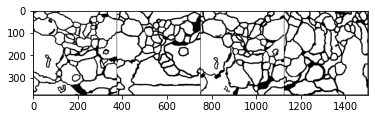

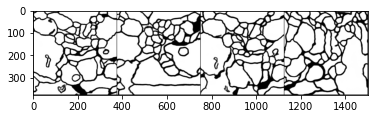

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 182: Step 1460: U-Net loss: 0.08305460214614868


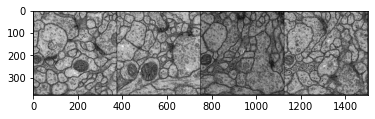

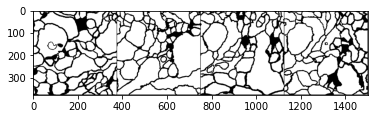

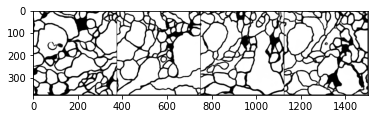

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 185: Step 1480: U-Net loss: 0.07920154929161072


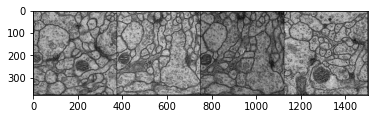

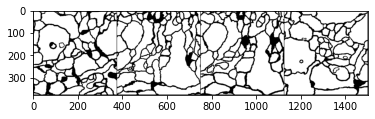

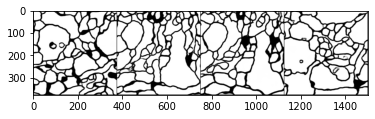

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 187: Step 1500: U-Net loss: 0.07551389187574387


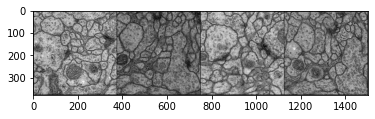

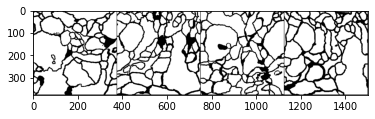

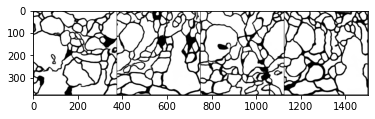

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 190: Step 1520: U-Net loss: 0.0715128481388092


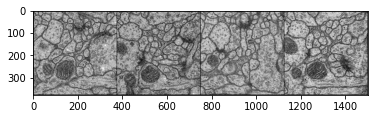

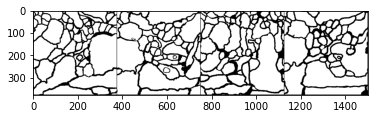

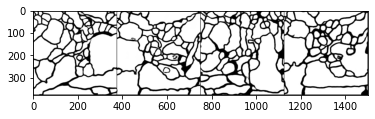

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 192: Step 1540: U-Net loss: 0.06857705116271973


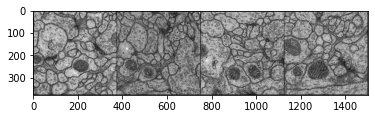

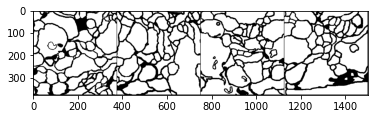

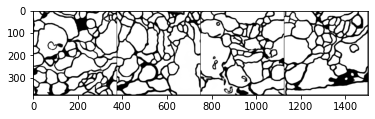

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 195: Step 1560: U-Net loss: 0.06546355783939362


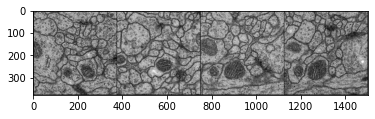

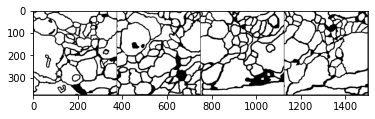

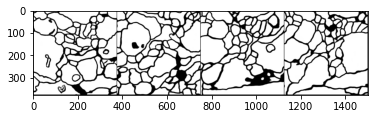

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 197: Step 1580: U-Net loss: 0.06389342248439789


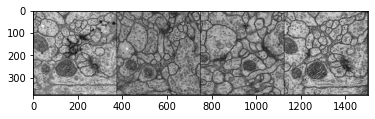

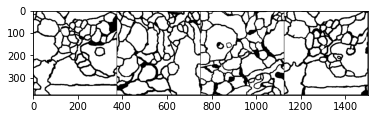

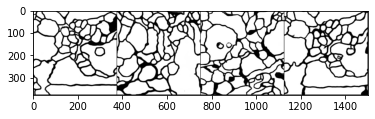

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [15]:
def train():
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True)
    unet = UNet(input_dim, label_dim).to(device)
    unet_opt = torch.optim.Adam(unet.parameters(), lr=lr)
    cur_step = 0

    for epoch in range(n_epochs):
        for real, labels in tqdm(dataloader):
            cur_batch_size = len(real)
            # Flatten the image
            real = real.to(device)
            labels = labels.to(device)

            ### Update U-Net ###
            unet_opt.zero_grad()
            pred = unet(real)
            unet_loss = criterion(pred, labels)
            unet_loss.backward()
            unet_opt.step()

            if cur_step % display_step == 0:
                print(f"Epoch {epoch}: Step {cur_step}: U-Net loss: {unet_loss.item()}")
                show_tensor_images(
                    crop(real, torch.Size([len(real), 1, target_shape, target_shape])), 
                    size=(input_dim, target_shape, target_shape)
                )
                show_tensor_images(labels, size=(label_dim, target_shape, target_shape))
                show_tensor_images(torch.sigmoid(pred), size=(label_dim, target_shape, target_shape))
            cur_step += 1

train()